In [1]:
# Initialize Otter
import otter
grader = otter.Notebook("covid_part1.ipynb")

# Final Project: COVID-19 Dataset
## Exploring COVID-19 Data through Modeling
## Due Date: Wednesday, November 17th, 11:59 PM
## Collaboration Policy

Data science is a collaborative activity. While you may talk with other groups about
the project, we ask that you **write your solutions within your own group**. If you do
discuss the assignments with others outside of your group please **include their names** at the top
of your notebook.

Will harvey


## This Assignment

In this final project, we will investigate COVID-19 data over the past year. This data contains information about COVID-19 case counts, mortalities, vaccination rates, and various other metadata that can assist in modeling various aspects of COVID-19.

Through this final project, you will demonstrate your experience with:
* Data cleaning and EDA using Pandas
* Unsupervised and supervised learning techniques
* Visualization


## Goal

Model and analyze the temporal evolution of COVID-19 mortalities or cases using one unsupervised and one supervised technique of your choice. Interpret your models' results through visualizations, and draw insightful conclusions about the modeling of COVID-19 data.

Recall that we studied linear and logistic regression, decision trees, random forests as part of supervised learning (with labels) and clustering, PCA as part of unsupervised learning (without labels). You are free to use any methods that you find suitable to answer the problem at hand.

In [2]:
pip install geopy

Note: you may need to restart the kernel to use updated packages.


In [3]:
# Run this cell to set up your notebook
import numpy as np
from geopy import *
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.cluster import *
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from scipy.stats import pearsonr
import re

cases = pd.read_csv('data/time_series_covid19_confirmed_US.csv') # https://github.com/CSSEGISandData/COVID-19/blob/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_US.csv
vaccinations = pd.read_csv('data/people_vaccinated_us_timeline.csv') # https://raw.githubusercontent.com/govex/COVID-19/master/data_tables/vaccine_data/us_data/time_series/people_vaccinated_us_timeline.csv
counties = pd.read_csv('data/co-est2020.csv', encoding='latin-1') # https://www2.census.gov/programs-surveys/popest/datasets/2010-2020/counties/totals/co-est2020.csv
mask_use = pd.read_csv('data/mask-use-by-county.csv') # https://github.com/nytimes/covid-19-data/blob/master/mask-use/mask-use-by-county.csv

<br/><br/><br/>

---

<br/><br/><br/>

## Question 0: Basic Time Series Modeling

We will introduce a few basic modeling techniques using temporally correlated data that you are free to adapt or improve throughout your modeling process if you wish. Answer these questions in their respective cells below.

### Question 0a
Suppose $\tilde{x} = [1, x_{t}]$ represents the input to a machine learning function $f_\theta: \mathbb{R}^{2} \rightarrow \mathbb{R}$, and we wish to predict $x_{t + 1}$ such that $f_\theta(\tilde{x}) \approx x_{t+1}$. You may assume that $t = 0$ corresponds to the start of time. 

<!-- BEGIN QUESTION -->

i) Is this an example of supervised or unsupervised learning?
<!--
BEGIN QUESTION
name: q0ai
points: 2
manual: True
-->

This is an example of unsupervised learning. We are performing dimension reduction on unlabeled data. 

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

ii) Write the function $x_{t+1}$ explicitly in terms of the model parameters $\theta = [\theta_0, \theta_1]$ and $x_t$ assuming $f$ represents a linear model.
<!--
BEGIN QUESTION
name: q0aii
points: 2
manual: True
-->

$f_\theta(\tilde{x}) \approx x_{t+1} \approx \theta_0 + \theta_1 x_{t}$

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

iii) Suppose we obtain an optimal $\hat{\theta} = [\hat{\theta}_0, \hat{\theta}_1]$. Derive $x_{t+1}$ in terms of $x_0$, $\hat{\theta}_0$ and $\hat{\theta}_1$.

<!--
BEGIN QUESTION
name: q0aiii
points: 4
manual: True
-->

$\hat{\theta}_0 + \hat{\theta}_1$ $\sum_{i}^{t}$ $\hat{\theta}_0  \hat{\theta}_1^{i}$

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

iv) Suppose we add $k - 1$ more features such that our feature vector $\tilde{x}$ contains $k$ timesteps of past and current data. Describe how we could select an appropriate $k$.

<!--
BEGIN QUESTION
name: q0aiv
points: 2
manual: True
-->

_We can conduct k-fold cross validation to fit our model to the dataset. We would test different k's to find the root mean squared error between training and test subsets. The k that provides the lowest RMSE would indicate the best features to include in our model to minimize overfitting._

<!-- END QUESTION -->



<br/><br/><br/>

---

<br/><br/><br/>

## Question 1: Data Cleaning

### Question 1a

Investigate the number of missing or null values in `cases` and `vaccinations`. Which one column contains the *most* null values from both of these tables?

<!--
BEGIN QUESTION
name: q1a
points: 2
-->

In [8]:
most_null_value_col = 'People_Partially_Vaccinated'
most_null_value_col

'People_Partially_Vaccinated'

In [9]:
grader.check("q1a")

q1a results: All test cases passed!

### Question 1b

Impute the null values in *all* the datasets with zero values or empty strings where appropriate.

<!--
BEGIN QUESTION
name: q1b
points: 2
-->

In [10]:
def replace_val(df):
    for col in df:
        if df[col].dtype == 'string':
            df[col].fillna('', inplace = True)
        else:
            df[col].fillna(0, inplace = True)
            
replace_val(cases)
replace_val(vaccinations)
replace_val(counties)
replace_val(mask_use)

In [11]:
grader.check("q1b")

KeyError: 'otter'

### Question 1c

Add a column to `cases` named `median_increase` that describes the median daily increase in the number of cases over the time period January 23, 2020 to September 12, 2021. In other words, calculate the increase in cases day-to-day from January 22nd to 23rd, 23rd to 24th, 24th to 25th, and so on; then, find the median of the number of increase in cases over that time period for all counties.

*Hint*: Try not to use a `for` loop.

<!--
BEGIN QUESTION
name: q1c
points: 2
-->

In [12]:
cases['median_increase'] = cases.iloc[:, 11:].diff(axis=1).median(axis = 1)

In [13]:
grader.check("q1c")

KeyError: 'otter'

### Question 1d

Generate a valid FIPS code for the `counties` table.

*Hint*: Refer to [this](https://transition.fcc.gov/oet/info/maps/census/fips/fips.txt) guide on FIPS codes.

<!--
BEGIN QUESTION
name: q1d
points: 2
-->

In [14]:
counties['FIPS'] = counties['STATE'] * 1000 + counties['COUNTY']

In [15]:
grader.check("q1d")

q1d results: All test cases passed!

### Question 1e

Merge the `counties`, `cases`, and `mask_use` tables on an appropriate primary key to generate county-wise data.

<!--
BEGIN QUESTION
name: q1e
points: 2
-->

In [16]:
county_data = counties.merge(cases, on = 'FIPS').merge(mask_use, left_on = 'FIPS', right_on = 'COUNTYFP')

In [17]:
grader.check("q1e")

q1e results:
    q1e - 1 result:
        Trying:
            county_data.shape == (3141, 638)
        Expecting:
            True
        **********************************************************************
        Line 1, in q1e 0
        Failed example:
            county_data.shape == (3141, 638)
        Expected:
            True
        Got:
            False

    q1e - 2 result:
        Test case passed!

    q1e - 3 result:
        Test case passed!

<!-- BEGIN QUESTION -->

### Question 1f

Generate the population by state using `counties` using the population estimate in 2020 (i.e. `POPESTIMATE2020`). Remark on any inconsistencies and propose a solution. 
<!--
BEGIN QUESTION
name: q1f
points: 2
manual: True
-->

Calculating populations from the counties table with groupby gives numbers that are significantly larger than the values I expected. This is because there is a row for each state (i.e. STNAME = Alabama & CTYNAME = Alabama) so when generating population totals with groupby, each state's total gets double counted. To fix this, I would remove the rows where state name matches county name. 

In [18]:
pop_by_state = counties.groupby('STATE').agg(sum)['POPESTIMATE2020']

<!-- END QUESTION -->



<br/><br/><br/>

---

<br/><br/><br/>

## Question 2: Guided EDA

<!-- BEGIN QUESTION -->

### Question 2a

Create a visualization that shows the median increase in number of cases for the 50 counties with the greatest median increase over January 23, 2020 to September 12, 2021. Make sure to include the name of state in which each county is located since county names are not necessarily unique.
<!--
BEGIN QUESTION
name: q2a
points: 3
manual: True
-->

Text(0.5, 1.0, 'Median Number of Case Increases over January 23, 2020 to September 12, 2021 by County')

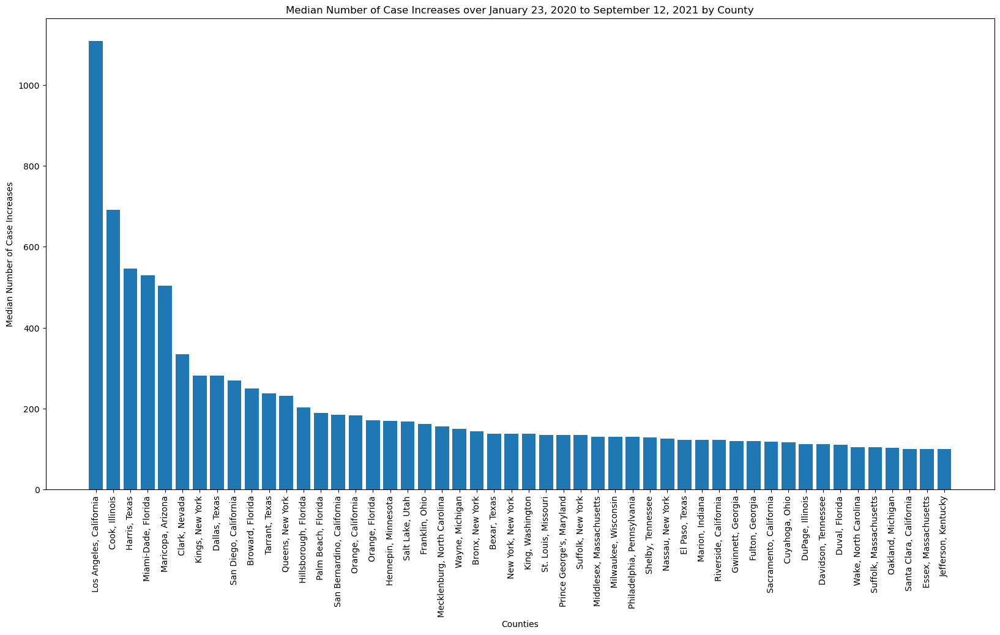

In [19]:
sorted_cases = cases[['Admin2', 'Province_State', 'median_increase']].sort_values(by='median_increase', ascending=False)[:50]
sorted_cases['county_state'] = sorted_cases['Admin2'] + ', ' + sorted_cases['Province_State'] 

plt.figure(figsize=(20, 10))
plt.bar(sorted_cases['county_state'], sorted_cases['median_increase'])
plt.xticks(rotation=90);
plt.xlabel('Counties')
plt.ylabel('Median Number of Case Increases')
plt.title('Median Number of Case Increases over January 23, 2020 to September 12, 2021 by County')

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 2b

Create a visualization that shows the overall county-wise distribution of the number of COVID-19 cases per capita across the United States as a function of time. For all questions that reference population, use the population estimates from 2020.
<!--
BEGIN QUESTION
name: q2b
points: 4
manual: True
-->

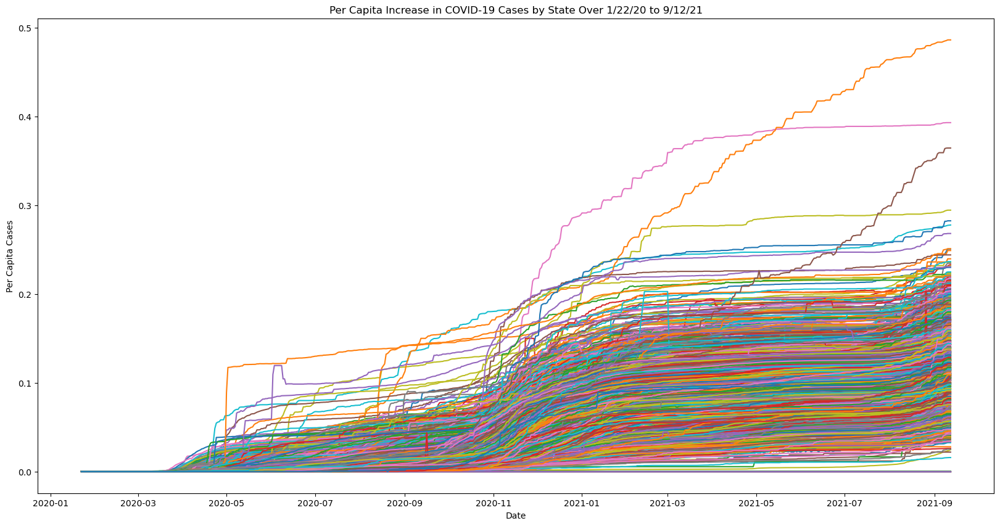

In [20]:
data_2b = county_data.copy()
data_2b_casespercapita = data_2b.loc[:, '1/22/20':'9/12/21'].divide(county_data['POPESTIMATE2020'], axis=0)
data_2b_casespercapita.columns = pd.to_datetime(data_2b_casespercapita.columns)

plt.figure(figsize=(20, 10))
plt.xlabel('Date')
plt.ylabel('Per Capita Cases')
plt.title('Per Capita Increase in COVID-19 Cases by State Over 1/22/20 to 9/12/21')
plt.plot(data_2b_casespercapita.T);


<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 2c

Create a visualization that shows states' increases in the number of COVID-19 cases per capita from September 3rd to September 12th, sorted from least to greatest increases. 

<!--
BEGIN QUESTION
name: q2c
points: 3
manual: True
-->

Text(0.5, 1.0, 'Per Capita Increase in Cases by State Between September 3rd 2021 and September 12th 2021')

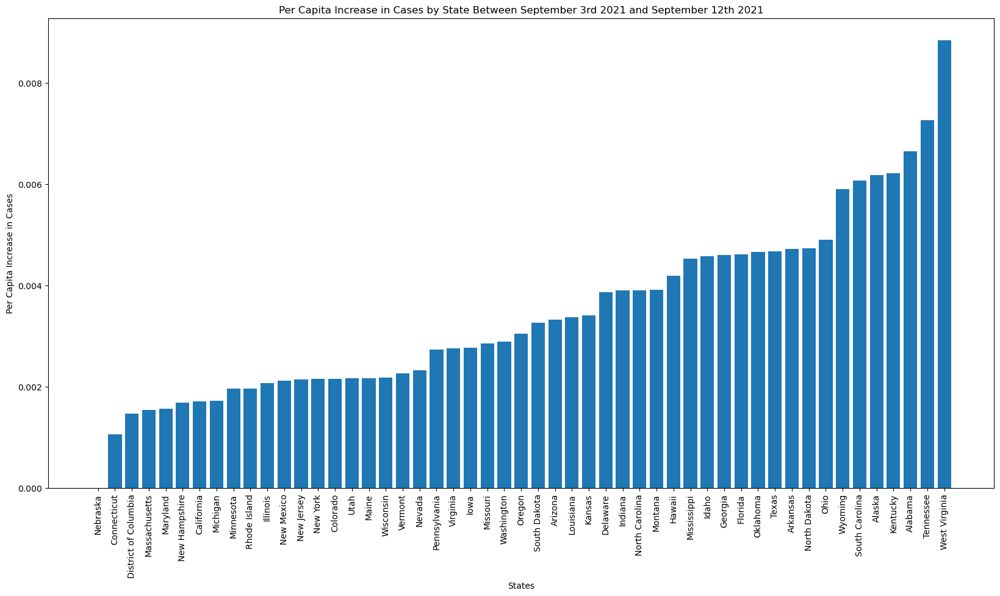

In [21]:
groupedby_state = county_data.groupby('STNAME').agg(sum)
per_capita_sept = ((groupedby_state['9/12/21'] - groupedby_state['9/3/21']) / groupedby_state['POPESTIMATE2020']).sort_values()
plt.figure(figsize=(20, 10))
plt.bar(per_capita_sept.index, per_capita_sept)
plt.xticks(rotation=90);
plt.xlabel('States')
plt.ylabel('Per Capita Increase in Cases')
plt.title('Per Capita Increase in Cases by State Between September 3rd 2021 and September 12th 2021')

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 2d

Create a plot using a technique of your choice that visualizes the relationship between:

a) the number of COVID-19 cases as a function of time for the Mobile, Tarrant, Cook, and San Fransisco counties located in Alabama, Texas, Illinois, and California.

b) the frequency of never, rarely or sometimes wearing a mask in the respective counties

*Hint*: You may find a description of the data [here](https://github.com/CSSEGISandData/COVID-19/blob/846fa9458cc2a8904d2492d14d3e6b4f399ec027/csse_covid_19_data/csse_covid_19_time_series/README.md).

<!--
BEGIN QUESTION
name: q2d
points: 3
manual: True
-->

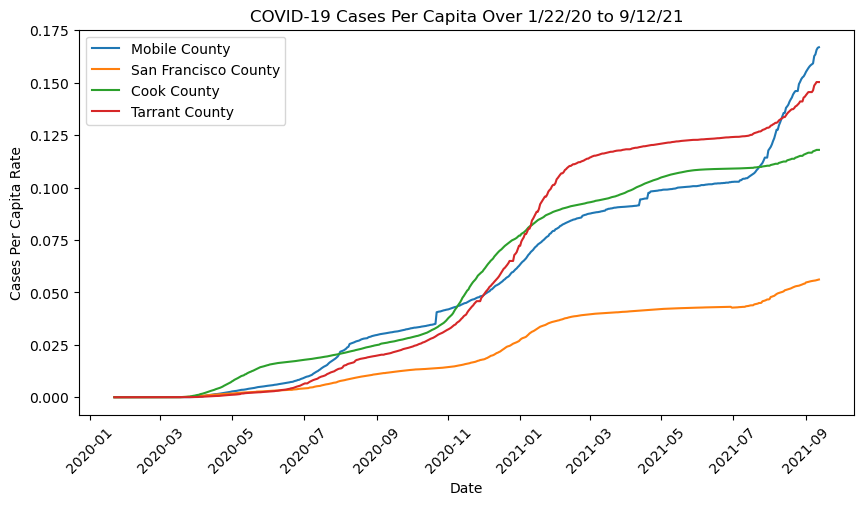

In [22]:
data_2d = county_data.loc[county_data['CTYNAME'].isin(['Mobile County', 'Tarrant County', 'Cook County', 'San Francisco County']) 
                    & county_data['STNAME'].isin(['Alabama', 'Texas', 'Illinois', 'California'])]
data_2d2 = data_2d.loc[:, '1/22/20':'9/12/21'].divide(data_2d['POPESTIMATE2020'], axis=0)
data_2d2.columns = pd.to_datetime(data_2d2.columns)

plt.figure(figsize=(10, 5))
plt.plot(data_2d2.T)
plt.legend(['Mobile County', 'San Francisco County', 'Cook County', 'Tarrant County'])
plt.title('COVID-19 Cases Per Capita Over 1/22/20 to 9/12/21')
plt.ylabel('Cases Per Capita Rate')
plt.xlabel('Date')
plt.xticks(rotation=45);

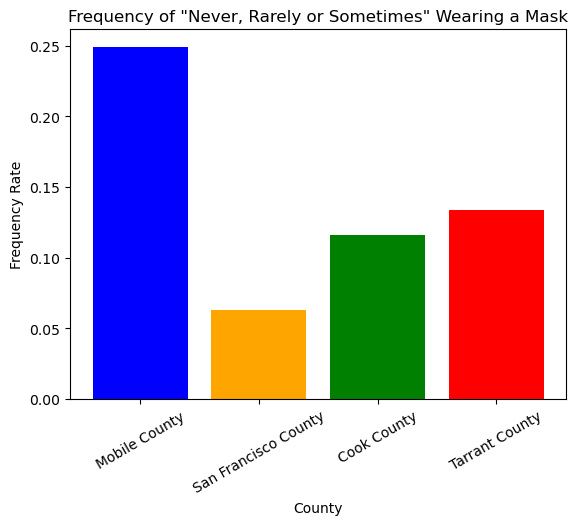

In [23]:
data_2d['Mask Freq'] = data_2d['NEVER'] + data_2d['RARELY'] + data_2d['SOMETIMES']
plt.bar(data_2d['CTYNAME'], data_2d['Mask Freq'], color=['b', 'orange', 'g', 'r'])
plt.title("Frequency of \"Never, Rarely or Sometimes\" Wearing a Mask")
plt.ylabel('Frequency Rate')
plt.xlabel('County')
plt.xticks(rotation=30);

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 2e

Visualize and describe the spatial relationship between the location and the following quantities over the continguous United States:

a) the number of most recent COVID-19 cases per capita on September 12, 2021

b) the frequency of never, rarely or sometimes wearing a mask

*Hint*: Use `plotly` to generate a heatmap on a geographical plot of the United States!

<!--
BEGIN QUESTION
name: q2e
points: 5
manual: True
-->

In [24]:
county_data

,SUMLEV,REGION,DIVISION,STATE,COUNTY,STNAME,CTYNAME,CENSUS2010POP,ESTIMATESBASE2010,POPESTIMATE2010,...,9/10/21,9/11/21,9/12/21,median_increase,COUNTYFP,NEVER,RARELY,SOMETIMES,FREQUENTLY,ALWAYS
0,50,3,6,1,1,Alabama,Autauga County,54571,54582,54761,...,9207,9246,9287,10.0,1001,0.053,0.074,0.134,0.295,0.444
1,50,3,6,1,3,Alabama,Baldwin County,182265,182263,183121,...,34726,34872,34950,24.0,1003,0.083,0.059,0.098,0.323,0.436
2,50,3,6,1,5,Alabama,Barbour County,27457,27454,27325,...,3260,3282,3295,3.0,1005,0.067,0.121,0.120,0.201,0.491
3,50,3,6,1,7,Alabama,Bibb County,22915,22904,22858,...,3752,3778,3795,3.0,1007,0.020,0.034,0.096,0.278,0.572
4,50,3,6,1,9,Alabama,Blount County,57322,57322,57372,...,9095,9161,9176,8.0,1009,0.053,0.114,0.180,0.194,0.459
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3136,50,4,8,56,37,Wyoming,Sweetwater County,43806,43806,43580,...,6111,6111,6111,3.0,56037,0.061,0.295,0.230,0.146,0.268
3137,50,4,8,56,39,Wyoming,Teton County,21294,21298,21298,...,4611,4611,4611,2.0,56039,0.095,0.157,0.160,0.247,0.340
3138,50,4,8,56,41,Wyoming,Uinta County,21118,21121,21090,...,3204,3204,3204,1.0,56041,0.098,0.278,0.154,0.207,0.264
3139,50,4,8,56,43,Wyoming,Washakie County,8533,8528,8531,...,1120,1120,1120,0.0,56043,0.204,0.155,0.069,0.285,0.287


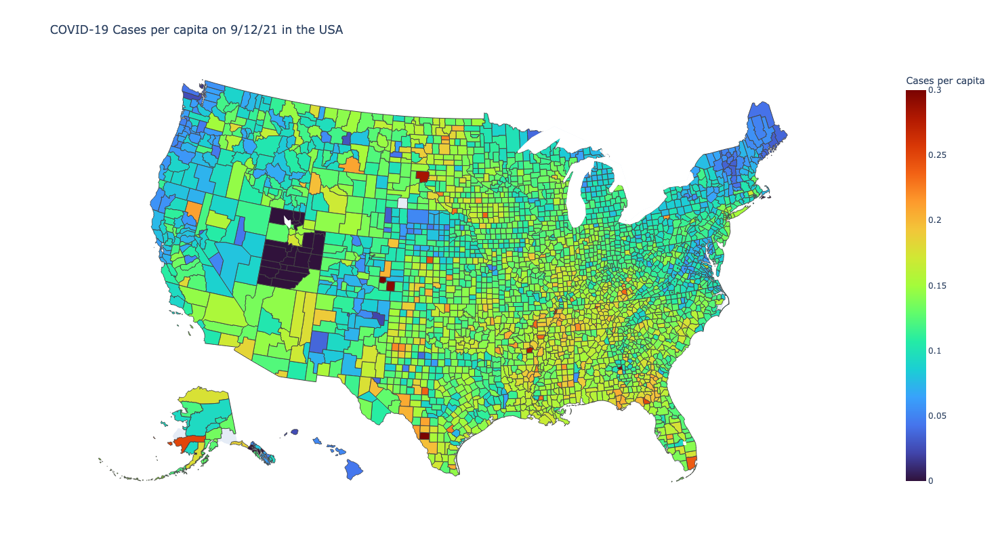

In [25]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties_polygons = json.load(response)

data_2e = county_data.copy()
data_2e['FIPS 5_digit'] = data_2e.apply(lambda x: "%02d%03d" % (x['STATE'],x['COUNTY']),axis=1)
data_2e['Mask Freq'] = data_2e['NEVER'] + data_2e['RARELY'] + data_2e['SOMETIMES']
data_2e = data_2e[['FIPS 5_digit', '9/12/21', 'Mask Freq']]
data_2e['9/12/21'] = data_2e['9/12/21'].divide(county_data['POPESTIMATE2020'], axis=0)

px.choropleth(data_2e, geojson=counties_polygons, locations='FIPS 5_digit', color='9/12/21',
              color_continuous_scale="Turbo", range_color=(0, 0.3), scope="usa", 
              labels={'9/12/21':'Cases per capita'}, title='COVID-19 Cases per capita on 9/12/21 in the USA',
            width = 800, height=800)


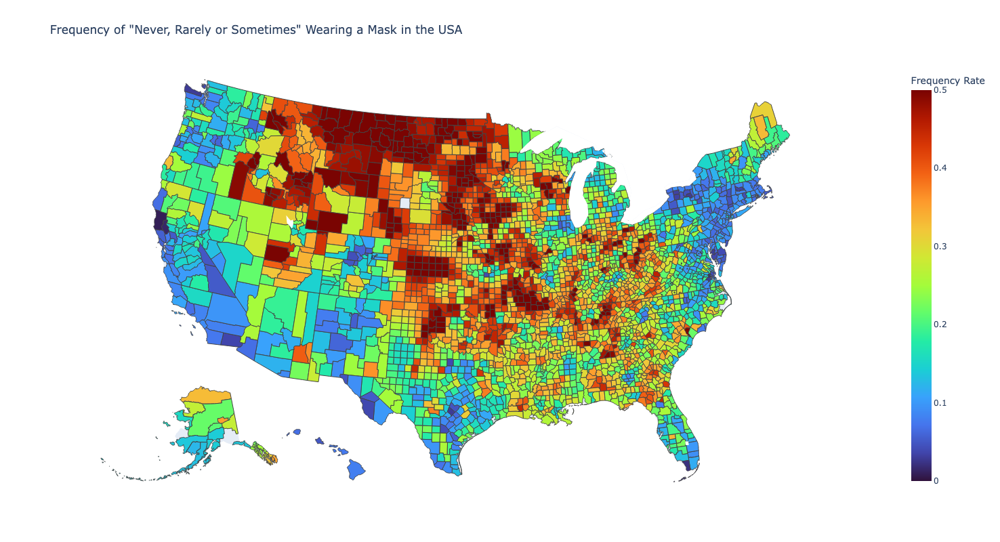

In [26]:
px.choropleth(data_2e, geojson=counties_polygons, locations='FIPS 5_digit', color='Mask Freq',
              color_continuous_scale="Turbo", range_color=(0, 0.5), scope="usa", 
              labels={'Mask Freq':'Frequency Rate'}, title="Frequency of \"Never, Rarely or Sometimes\" Wearing a Mask in the USA",
             width = 800, height=800)

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 2f

Describe and interpret the relationships in the plots above. What conclusions can be drawn about the COVID-19 dataset from these plots?

<!--
BEGIN QUESTION
name: q2f
points: 3
manual: True
-->

Comparing the two plots, it is not difficult to see that there is a correlation between reduced mask usage and higher COVID-19 case counts. In places like San Francisco and New York City, where mask usage is widespread, there are relatively low levels of COVID cases. Whereas in southeastern states and central US where mask usage is much lower, there are higher levels of cases. However this does not always hold true such as in Maine, due to other factors like population density. Additionally, the mask data provided was published in July 2020, and thus is difficult to compare to data in 9/12/21

<!-- END QUESTION -->



<br/><br/><br/>

---

<br/><br/><br/>

## Question 3: Guided Unsupervised Exploration


<!-- BEGIN QUESTION -->

### Question 3a

Using SVD, decompose the standardized matrix $X$ that contains the standardized current proportion of fully vaccinated and partially vaccinated, cases per capita, and mask usage for every state as of the most recent day in the data.

*Hint*: The matrix $X$ should have rows that describe location.

<!--
BEGIN QUESTION
name: q3a
points: 3
manual: True
-->

In [27]:
groupedby_state = county_data.groupby('STNAME').agg(sum)
gb_state_avg = county_data.groupby('STNAME').agg(np.mean)

In [28]:
v = (vaccinations.loc[(vaccinations['Date'] == '2021-09-21')])
v = v.loc[(v['Province_State'].isin(groupedby_state.index))]
v = v.set_index('Province_State')

#Proportion vaxxed and part-vaxxed
prop_fullvax = v['People_Fully_Vaccinated'] / groupedby_state['POPESTIMATE2020']
prop_partvax = v['People_Partially_Vaccinated'] / groupedby_state['POPESTIMATE2020']
#cases per capita
cases_per_capita = groupedby_state['9/12/21'] / groupedby_state['POPESTIMATE2020']

x = pd.DataFrame()
x['Fully Vaccinated (Proportion)'] = prop_fullvax
x['Partially Vaccinated (Proportion)'] = prop_partvax
x['Cases per Capita'] = cases_per_capita
x['Never'] = gb_state_avg['NEVER']
x['Rarely'] = gb_state_avg['RARELY'] 
x['Sometimes'] = gb_state_avg['SOMETIMES']
x['Frequently'] = gb_state_avg['FREQUENTLY']
x['Always'] = gb_state_avg['ALWAYS']

X = x.apply(lambda x: (x - x.mean())/np.std(x), axis = 0)
u, s, vt = np.linalg.svd(X, full_matrices = False)

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 3b

Visualize the top 2 principal components and label the data points with the corresponding location. Color each data points based on the number of cases per capita in the location to which it corresponds.

<!--
BEGIN QUESTION
name: q3b
points: 3
manual: True
-->

In [29]:
pcs = (X @ vt.T)[[0,1]].rename(columns = {0:'pc1', 1:'pc2'}).set_index(X.index)
pcs['Cases per Capita'] = cases_per_capita

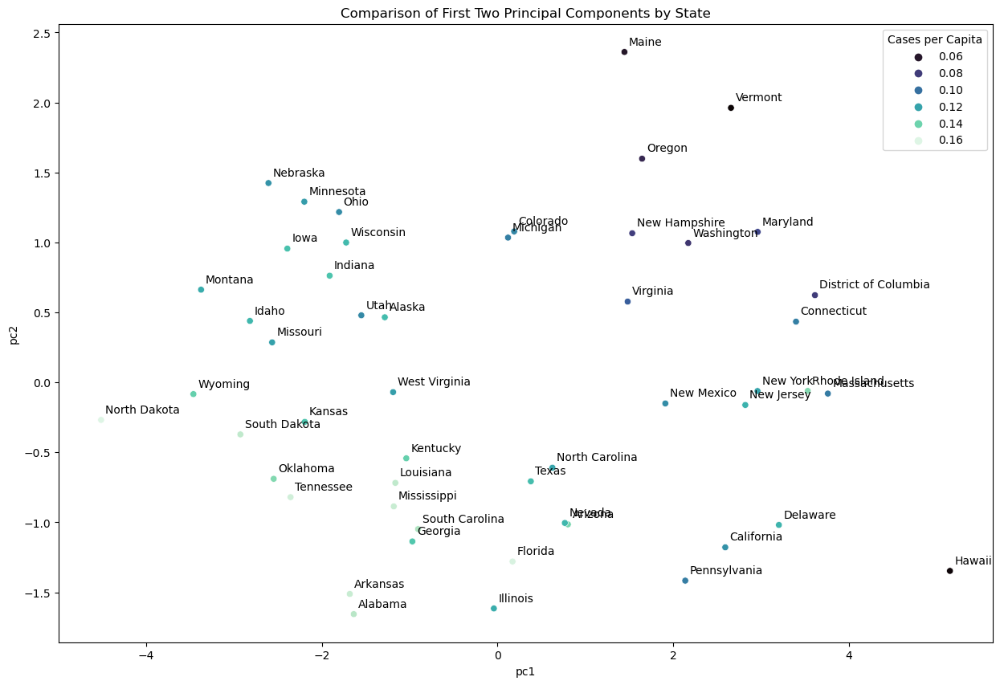

In [30]:
plt.figure(figsize = (15, 10))
plot = sns.scatterplot(data = pcs, x = "pc1", y = "pc2", hue = pcs['Cases per Capita'], palette = "mako", legend = 'auto', );
plt.title('Comparison of First Two Principal Components by State')
for i in range(0, pcs.shape[0]):
    plot.text(x = pcs.pc1[i]+0.05, y = pcs.pc2[i]+0.05, s = pcs.index[i])

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 3c

What could the first and second principal component roughly represent? Interpret the visualization above and report any findings from the first two principal components given by PCA.

<!--
BEGIN QUESTION
name: q3c
points: 3
manual: True
-->

In [31]:
def find_leaders(df):
    for i in df.columns:
        highest = df.sort_values(i, ascending = False)
        lowest = df.sort_values(i, ascending = True)
        print(i + ' HIGHEST:' , highest.head(5).index)
        print(i + ' LOWEST:' , lowest.head(5).index)
        
        
find_leaders(x)

Fully Vaccinated (Proportion) HIGHEST: Index(['Rhode Island', 'District of Columbia', 'Vermont', 'Connecticut',
       'Maine'],
      dtype='object', name='Province_State')
Fully Vaccinated (Proportion) LOWEST: Index(['Wyoming', 'Alabama', 'Idaho', 'Mississippi', 'North Dakota'], dtype='object', name='Province_State')
Partially Vaccinated (Proportion) HIGHEST: Index(['Hawaii', 'Illinois', 'Pennsylvania', 'California', 'Alabama'], dtype='object', name='Province_State')
Partially Vaccinated (Proportion) LOWEST: Index(['Indiana', 'Ohio', 'Iowa', 'Wisconsin', 'Michigan'], dtype='object', name='Province_State')
Cases per Capita HIGHEST: Index(['North Dakota', 'Florida', 'Tennessee', 'Mississippi', 'Arkansas'], dtype='object', name='Province_State')
Cases per Capita LOWEST: Index(['Vermont', 'Hawaii', 'Maine', 'Oregon', 'Washington'], dtype='object', name='Province_State')
Never HIGHEST: Index(['North Dakota', 'Wyoming', 'Montana', 'South Dakota', 'Missouri'], dtype='object', name='Province

PC1 seems to represent cases per capita. States further to the right generally have darker dots, representing lower cases per capita. Meanwhile the states to the left, with lower PC1 values, generally have higher case numbers per capita. The states with the highest proportion of "Always" mask-wearers generally have higher PC1 values while the states with the lowest proportion generally have low PC1 values. The opposite is true for 'Never' mask wearers, which makes sense. Both trends are quite strong. 

PC2 is significantly harder to determine based off of the information above. One apparent trend is that cases per capita also seem to decrease while moving up the graph, suggesting that cases per capita influences PC2 as well as PC1.The 5 states with the highest proportion of partially vaccinated people have some of the lowest PC2 scores while the 5 states with the lowest proportions have some of the highest. Interestingly, the states with high PC2 values and low cases per capita are among the states with the highest rate of full vaccination. Therefore, it seems PC2 represents partial vaccination. 


<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 3d

Construct a scree plot displaying the proportion of variance captured by each principal component.

<!--
BEGIN QUESTION
name: q3d
points: 3
manual: True
-->

Text(0.5, 1.0, 'Fraction of Variance Explained by Each Principal Component')

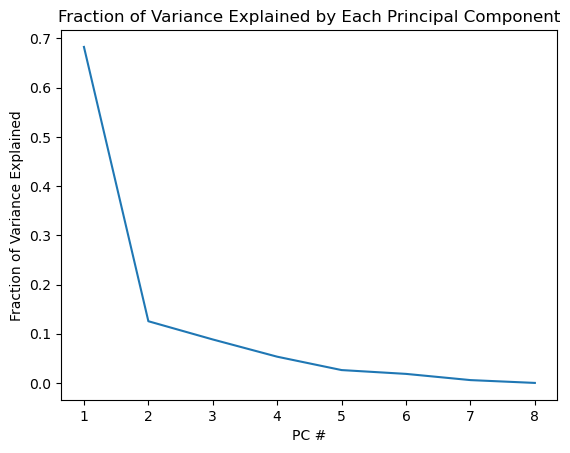

In [32]:
all_pcs = (X @ vt.T).rename(columns = {0:'pc1', 
                                             1:'pc2',
                                            2 : 'pc3', 
                                            3 : 'pc4', 
                                            4 : 'pc5',
                                            5: 'pc6',
                                            6 : 'pc7', 
                                      7 : 'pc8'}).set_index(X.index)


plt.plot([1, 2, 3, 4, 5, 6, 7, 8], s**2 / sum(s**2));
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8], [1, 2, 3, 4, 5, 6, 7, 8]);
plt.xlabel('PC #');
plt.ylabel('Fraction of Variance Explained');
plt.title('Fraction of Variance Explained by Each Principal Component')

<!-- END QUESTION -->

### Question 3e

Using the 2D representation of each state's first two principal components $x_i = [\text{PC}_1, \text{PC}_2]$, find each state's 5 closest principal component neighbors using Euclidean distance as the metric. In other words, for each state $i$ with first two principal components $x_i$, the following would be its *closest* principal component neighbor:

$$
\arg \min_{j \ne i} ||x_j - x_i||_2
$$

Store each state's 5 closest neighbors in a Pandas DataFrame, where the index is the state's name and the columns are the 5 closest PC neighbors.

<!--
BEGIN QUESTION
name: q3e
points: 3
-->

In [33]:
first_two_pcs = all_pcs[['pc1', 'pc2']]
state_mins = pd.DataFrame


def get_n_neighbor(statename, num):
    state = first_two_pcs.loc[first_two_pcs.index == statename]
    scores = []
    for i in first_two_pcs.index:
        comp = first_two_pcs.loc[first_two_pcs.index == i]
        score = np.sqrt(np.sum(np.square(state.values - comp.values)))
        scores.append((i, score))
    scores.sort(key=lambda tup: tup[1])
    return scores[num][0]

In [34]:
first_two_pcs = all_pcs[['pc1', 'pc2']]
state_mins = pd.DataFrame()

state_mins['states'] = X.index
state_mins['1st Neighbor'] = [get_n_neighbor(i, 1) for i in pcs.index]
state_mins['2nd Neighbor'] = [get_n_neighbor(i, 2) for i in pcs.index]
state_mins['3rd Neighbor'] = [get_n_neighbor(i, 3) for i in pcs.index]
state_mins['4th Neighbor'] = [get_n_neighbor(i, 4) for i in pcs.index]
state_mins['5th Neighbor'] = [get_n_neighbor(i, 5) for i in pcs.index]
state_mins.set_index('states', inplace = True)

In [35]:
grader.check("q3e")

KeyError: 'otter'

<!-- BEGIN QUESTION -->

### Question 3f

Investigate the principal component neighbors for two states of your choice, and remark on any observations you have about their COVID-19 statistics given in the dataset, geographical or political ties. 

Compare these neighbors with the rankings from the visualization from Question 2c that depicted recent greatest increases in cases across states.

<!--
BEGIN QUESTION
name: q3f
points: 3
manual: True
-->

California: Pennsylvania, Delaware - I am surprised that these would be California's two closest neighbors. Both states are on the east coast. While pennsylvania, its 1st neighbor, is one of the more populous states, Delaware is tiny. Politically, Pennsylvania is kind of a swing state, but Delaware is pretty similar to California in therm of its recent history as a blue state. The three states aren't very close on the figure in 2c, and California is pretty far down on the low end. They are not very similar in terms of cases per capita, but they are all somewhat between the two extremes. All three states have relatively high rates of vaccination and mask use. 

Alabama: Arkansas, Georgia - all three are in the top 15 for per capita increases of cases during September of 2021. Therefore it makes a lot of sense that they would have similar principal components, as a sharp spike in cases would likely put them all in a similar COVID situation. Unlike with California, Alabama is geographically close to its two closest principal component neighbors. All three states share a reputation of being red states as well. All three share high case counts per capita as of September 21, 2021, which makes sense because they were all experiencing some of the highest COVID spikes in the nation during that month.


<!-- END QUESTION -->

### Question 3g

We will investigate the relationship between geographical distance in miles and top two principal component distance between any two unique pairs of states. 

For the sake of simplicity, may assume that the singular geographical location of a state is given by the mean latitude and longitude of all the counties in that state. For each unique pair of states, calculate the geographical distance and the Euclidean distance between their top 2 principal components between them. Plot the relationship where the x-axis represents the top 2 principal component distance and the y-axis represents geographical distance.

*Hint*: `geopy` has a function that can calculate distance between two pairs of latitude and longitude!

*Hint*: You should be plotting 1,275 points.

<!--
BEGIN QUESTION
name: q3g
points: 3
-->

In [ ]:
state_geog_loc = gb_state_avg[['Lat', 'Long_']]
from geopy.distance import geodesic

In [ ]:
geog_diffs = []
pc_diffs = []
for state in state_geog_loc.index:
    for st in first_two_pcs.index:
        if state < st:
            state_a_geog = state_geog_loc.loc[state_geog_loc.index == state].values
            state_a_pc = first_two_pcs.loc[first_two_pcs.index == state].values
            state_b_geog = state_geog_loc.loc[state_geog_loc.index == st].values
            state_b_pc = first_two_pcs.loc[first_two_pcs.index == st].values
            
            geog_diff = geodesic(state_a_geog, state_b_geog).km
            pc_diff = np.sqrt(np.sum(np.square(state_a_pc - state_b_pc)))
            
            geog_diffs.append((state, st, geog_diff))
            pc_diffs.append((state, st, pc_diff))

geog_df = pd.DataFrame(geog_diffs, columns = ['State A', 'State B', 'Geographical Distance'])
pc_df = pd.DataFrame(pc_diffs, columns = ['State A', 'State B', 'Principal Component Distance'])
merged_df = geog_df.merge(pc_df, on = ['State A', 'State B'])

In [ ]:
plt.figure(figsize = (15, 10))
sns.scatterplot(data = merged_df, x = 'Principal Component Distance', y = 'Geographical Distance')
plt.title('Geographical Distance and Principal Component Difference for Each Unique Combination of States')

### Question 3h

Interpret the relationship displayed in part (g). What does this suggest about the role that geography plays within this dataset despite no geographical information explicitly encoded within the matrix  $X$ from part (a)?

<!--
BEGIN QUESTION
name: q3h
points: 3
-->

The above graph shows something of a correlation between geographical distance and principal component distance. It seems that as the distance between states increases, the distance between their principal components also increases. While this trend isn't especially strong, it is clear that the role geography plays in this dataset is not negligible. This suggests that, although it is not explicitly encoded into X, geographical information may still impact principal component values. 

<!-- BEGIN QUESTION -->

<br/><br/><br/>

---

<br/><br/><br/>

## Question 4: Open EDA

Perform EDA of your choice on the data to generate 2 visualizations. You may follow the line of investigation in the guided sections by visualizing the relationship between safety protocols and the spread of COVID-19 spatially or temporally, or you may explore other areas of your choice. 

For each visualization, make sure to address the following:

1. Address a relationship in the data concerning the spread, effect, or prevention of COVID-19 through a visualization, with at *most* one univariate data visualization. If needed, use an unsupervised learning technique such as PCA to reveal patterns within the data.
2. Comment on the visualization in terms of the distribution, trends, and patterns it shows.
3. Comment on what the visualization indicates about the data with regards to the features you may choose for a supervised learning task.

<!--
BEGIN QUESTION
name: q4
points: 30
manual: True
-->

In [ ]:
cases_and_mask_use = cases.merge(mask_use, left_on = "FIPS", right_on = "COUNTYFP")
cases_and_mask_use["HIGH USE"] = cases_and_mask_use["FREQUENTLY"] + cases_and_mask_use["ALWAYS"]
cases_and_mask_use
from scipy import stats
outliers_gone = cases_and_mask_use[(np.abs(stats.zscore(cases_and_mask_use["median_increase"])) < 3)]
plt.figure(figsize = (20, 15))
plt.scatter(data = outliers_gone, x = "ALWAYS", y = "median_increase", s = 30)
plt.xlabel("Proportion of people who report always using a mask per county")
plt.ylabel("Median daily cases increase per county")
plt.title("Proportion of people who report always using a mask per county vs Median daily cases increase per county")

“_We see that there is a positive correlation between the proportion of people that report that they always use a mask and the median daily increase in cases per county. This could be because where there is a higher average increase in cases, there is also more perceived fear about the spread of Covid which lead to more people wanting to wear masks._

_This data shows that we might not want to use our mask use statistics in a supervised learning task since the relationship is likely only correlation rather than a causation._
“

In [ ]:
grouped_cases = cases.groupby("Province_State").agg(sum).iloc[:, 5:-1]

total_cases = []
increase = grouped_cases.diff(axis=1).fillna(0)
for column in increase:
    total_cases.append(sum(increase[column]))

grouped_vacc = vaccinations.groupby("Date").agg(sum).iloc[:]

total_cases = np.log2(total_cases)
#increase_vacc = grouped_vacc.diff(axis=1).fillna(0).iloc[:, 3]
increase_vacc = ([0] * 329) + list(grouped_vacc.iloc[:, 3].diff().fillna(0))
increase_vacc = np.log2(increase_vacc)
#total_vacc = np.log2(list(grouped_vacc.iloc[:, 3]))
#total_vacc
#print(len(total_cases))
dates = ["1/22/20", "2021-09-26"]
plt.figure(figsize = (20, 15))
plt.xticks([0,614], dates)
plt.plot(total_cases, label = "Daily Case Increase")
plt.plot(increase_vacc, label = "Daily Vaccination Increase")
plt.xlabel("Date")
plt.ylabel("Log adjusted number of people")
plt.title("Log Adjusted Daily Case Increase vs Log Adjusted Daily Vaccination Increase")
plt.legend()

“_We can clearly see a negative correlation between daily increase in vaccinations and the daily case increase._

_We may want to use average daily increase in vaccinations in our supervised learning task_
”


---

To double-check your work, the cell below will rerun all of the autograder tests.

In [ ]:
grader.check_all()

## Submission

Make sure you have run all cells in your notebook in order before running the cell below, so that all images/graphs appear in the output. The cell below will generate a zip file for you to submit. **Please save before exporting!**

In [ ]:
# Save your notebook first, then run this cell to export your submission.
grader.export()